In [122]:
import re
import string
from siuba import _, count, unnest
from mizani.formatters import percent_format, date_format, custom_format
from mizani.breaks import date_breaks
import pandas as pd
import numpy as np
from numpy.random import randn
from itertools import combinations
from plotnine import *
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
sns.set(rc={'figure.figsize':(5,5)})
sns.set_style('darkgrid')

### Data loading and checking completeness of data

<AxesSubplot: >

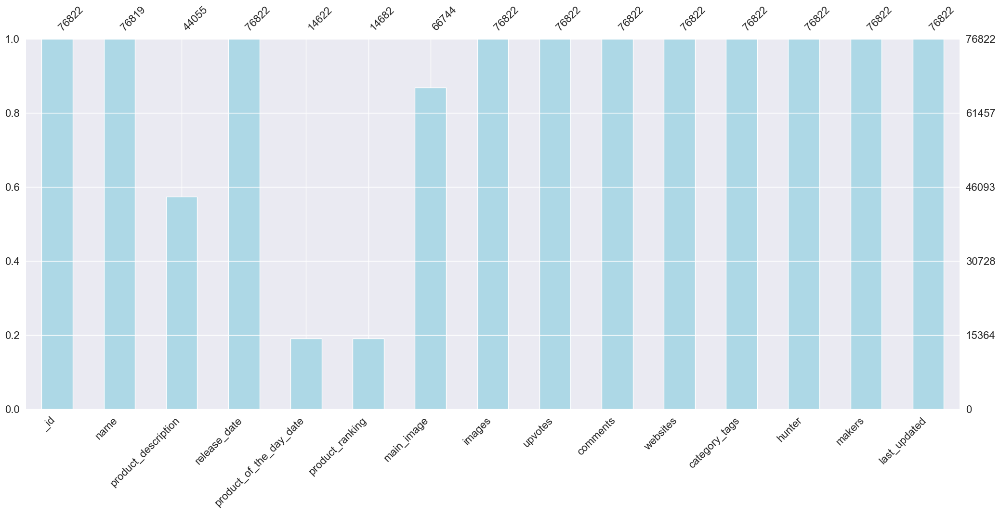

In [123]:
import missingno as msno
from missingno import bar
df = pd.read_csv("product_hunt.csv")
msno.bar(df, color='lightblue')

As we see, only around 20% of total products are ranked - <i>product_of_the day</i> relates to <i>product_ranking</i> value, we are going to return to these variables in one of the follwoing sections. Apart from these, and 1 more variable <i>product_description</i> the rest of data is totally complete.

In [124]:
df.describe(exclude=["int64", 'float64'])

,_id,name,product_description,release_date,product_of_the_day_date,main_image,images,comments,websites,category_tags,hunter,makers,last_updated
count,76822,76819,44055,76822,14622,66744,76822,76822,76822,76822,76822,76822,76822
unique,76822,73301,43789,2922,2920,66513,63188,73446,74705,29190,27954,47420,76822
top,https://www.producthunt.com/posts/ar-fidget-sp...,Flow,We launched Front in 2014 and have been workin...,2016-01-27 00:00:00.000,2019-02-12,https://ph-files.imgix.net/1c84689b-2b38-4146-...,[],[],['https://play.google.com/store/apps/details'],['TECH'],chrismessina,[],2022-01-11 01:34:10.874
freq,1,11,7,76,7,8,13557,3242,908,9578,2582,17152,1


### Plan of work
We can spot few facts here:
  - comments are widely present across majority of products - almost 96% of products has a comment. We can check:
    -  what are the comments distribution
    -  are hunters actively commenting on their products to 'boost the traffic'
- most popular category is "TECH", however it must be noted that it's a multicategory field; we need to explore it further:
  - split the categories
  - find top categories
  - find trends over time
- one hunter is particularly active: <i>chrismessina</i>, he/she promotes 2582 products! Are top hunters succesful in their 'hunting' job - do their products got awards?
- websites: are there mainly android/iphone apps, or maybe customized?

### Cleaning the dataset
Two functions are defined in order to extract information from <i>comments</i>. First function <i>count_regex2</i>, is looking for a fixed pattern in consecutive records of a column. Second function <i>count_variable_regex</i> does the same, except this time pattern is a value from another column in DF.

Defining cleaning pipeline:
- remove uninformative columns
- apply pattern-finding functions; new variables are <i>count_comments</i> which shows total number of comments in particular record, and <i>hunter_occurence</i>, which counts how many times a hunter comments in his posted product thread
- create <i>users_only_comments</i> - number of solely user comments -> <i>hunter</i> comment count is substracted
- typecasting variables


In [125]:
#search for pattern in a string column and count pattern occurence; fixed pattern
def count_regex2(df, pattern, column):
    return df.assign(count_comments = df.apply(lambda x: len(list(re.finditer(pattern, x[column]))), axis=1))
#search for pattern in a string column and count pattern occurence ; pattern as variable inside DF
def count_variable_regex(df, pattern, column):
    return df.assign(hunter_occurence = df.apply(lambda x: len(list(re.finditer(f"\\'{x[pattern]}\\'", x[column]))), axis=1))

df_cleaning = df\
    .drop(columns = ['images', 'main_image', 'last_updated'])\
    .pipe(count_regex2, pattern=r"{'user_name':", column='comments')\
    .pipe(count_variable_regex, pattern = 'hunter', column='comments') \
    .assign(users_only_comments = lambda x: x.count_comments - x.hunter_occurence) \
    .astype({'release_date': 'datetime64[ns]', 'product_of_the_day_date': 'datetime64[ns]'}) \
    .astype({'upvotes': np.int_, 'count_comments': np.int_, 'hunter_occurence': np.int_, 'product_ranking': np.float16})
print(df_cleaning.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76822 entries, 0 to 76821
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   _id                      76822 non-null  object        
 1   name                     76819 non-null  object        
 2   product_description      44055 non-null  object        
 3   release_date             76822 non-null  datetime64[ns]
 4   product_of_the_day_date  14622 non-null  datetime64[ns]
 5   product_ranking          14682 non-null  float16       
 6   upvotes                  76822 non-null  int32         
 7   comments                 76822 non-null  object        
 8   websites                 76822 non-null  object        
 9   category_tags            76822 non-null  object        
 10  hunter                   76822 non-null  object        
 11  makers                   76822 non-null  object        
 12  count_comments           76822 n

### Product Hunt popularity
Now we group all posted products per quarter. This will give a glimpse what is the platform popularity over time.

In [126]:
#Group by qurter
grouped_by_quarter = df_cleaning.groupby(pd.Grouper(key="release_date", axis = 0, freq="Q")).size().to_frame("count")
#Change display of index
grouped_by_quarter.index = grouped_by_quarter.index.strftime('%m-%Y')
#Plot line
fig = px.line(grouped_by_quarter, x = grouped_by_quarter.index, y='count',
              title = "Number of products released - groupped by quarter",
              labels = {'release_date': 'Release Date', 'count': 'Count'},
              width=1200,
              )
fig.update_layout(xaxis = dict(tickmode = 'array', 
                               tickvals = grouped_by_quarter.index))
fig.update_xaxes(tickangle=-90)
fig.show()

Peak of popularity platform gained in 2016 and 2021, currently it's downtrending (according to available data - end of 2021).

### Comments and upvotes

In [127]:
#Function for plotting histograms
def plot_histogram(df, column):
    fig = px.histogram(df, 
                   x=column, 
                   marginal='box', 
                   text_auto=True,
                   color_discrete_sequence  = ['steelblue'],
                   template='simple_white',
                   title=column.upper() + ' HISTOGRAM')
    fig.update_layout(xaxis_title=column, yaxis_title="Count", bargap=0.1)
    fig.show()
    return None

##### Upvotes histogram

In [128]:
plot_histogram(df_cleaning, 'upvotes')

Some of the products got remarkably high amount of votes. Let's look how many products broke the 10000-level:

In [129]:
df_cleaning[df_cleaning.upvotes > 10000].sort_values(by='upvotes', ascending=False)

,_id,name,product_description,release_date,product_of_the_day_date,product_ranking,upvotes,comments,websites,category_tags,hunter,makers,count_comments,hunter_occurence,users_only_comments
2360,https://www.producthunt.com/posts/startup-stash,Startup Stash,Startup Stash is a curated directory of resour...,2015-02-25,2015-02-25,1.0,21798,"[{'user_name': 'bramk', 'comment': 'Startup St...",['http://startupstash.com'],"['WEB APP', 'TECH', 'STARTUP LESSONS ']",bramk,['bramk'],44,13,31
2850,https://www.producthunt.com/posts/remove-bg,remove.bg,Remove.bg removes the background of any photo ...,2018-12-17,2018-12-17,1.0,16888,"[{'user_name': 'begroe', 'comment': ""Hi there,...",['https://www.remove.bg'],"['DESIGN TOOLS', 'PRODUCTIVITY', 'PHOTOGRAPHY']",begroe,"['begroe', 'davidfankhauser']",33,4,29
44613,https://www.producthunt.com/posts/startup-pitc...,Startup Pitch Decks,NaN,2016-09-06,2016-09-06,1.0,11060,"[{'user_name': 'gregoiregilbert', 'comment': '...",['https://attach.io/startup-pitch-decks/'],"['PRODUCTIVITY', 'MARKETING', 'TECH', 'VENTURE...",ryangum,['ryangum'],33,3,30
25389,https://www.producthunt.com/posts/pexels-2-0,Pexels 2.0,Pexels is a search engine for free stock photo...,2015-05-23,2015-05-26,1.0,10206,"[{'user_name': '3runjo', 'comment': 'Hey there...",['https://www.pexels.com/'],"['PHOTOGRAPHY', 'WEB APP', 'TECH', 'DESIGN TOO...",3runjo,"['3runjo', 'ingojoseph']",29,6,23


...only 4 apps, and all of them got 1st prize as <i>product_of_the_day</i>, meaning <b>upvotes</b> is the major contributor for assigning by portal the winners of an daily award.

In [130]:
fig = px.scatter(df_cleaning, y = df_cleaning.upvotes, x = df_cleaning.product_ranking.fillna(0), title = "Upvotes in relation to product ranking")
fig.update_xaxes(
                 tickmode = 'array',
                 tickvals =[1,2,3,4,5,0],
                 ticktext= [1,2,3,4,5, 0])
fig.update_layout(xaxis_title='Product Ranking', yaxis_title='Total upvotes')
fig.show()

Although we see 1-3 places to gather higher amounts of votes in general, there are also low-voted applications which di gather awards as well, which means that product-awarding formula is assessed also on other factors.

##### Comments histograms

In [131]:
plot_histogram(df_cleaning.query('count_comments < 400'), 'count_comments')
plot_histogram(df_cleaning.query('count_comments < 400'), 'users_only_comments')

Both distributions have similar IQR in range <3, 15> and <2, 11> for <i>total comments</i> and <i>user_only_comments</i> respectively. There is a significant difference only in the leftmost part of the distribution, because globally looking, most of the products are not successful ones (see first plot regarding 'missing data'). So for example in cases where <b>hunter</b> and <b>maker</b> is the same person and don't know how to promote a product properly, they try to increase traffic on Product Hunt by posting comments... from their own account.

We can also spot it on the following plot - high-voted apps don't need extensive commenting, they are simply good or had well-conducted promotion campaign:

In [132]:
fig = px.scatter(df_cleaning,
                 x='hunter_occurence', y='upvotes',
                 title="Quantity of upvotes vs. quantity of hunter comments",
                 labels = {'hunter_occurence': 'Number of hunter comments', 'upvotes': 'Upvotes'},
                 width=1200,
                 )
fig.show()

### Category Tags
Most of the products contain multiple categories. It's necessary to split them to single categories in order to make a visualization of popularity.

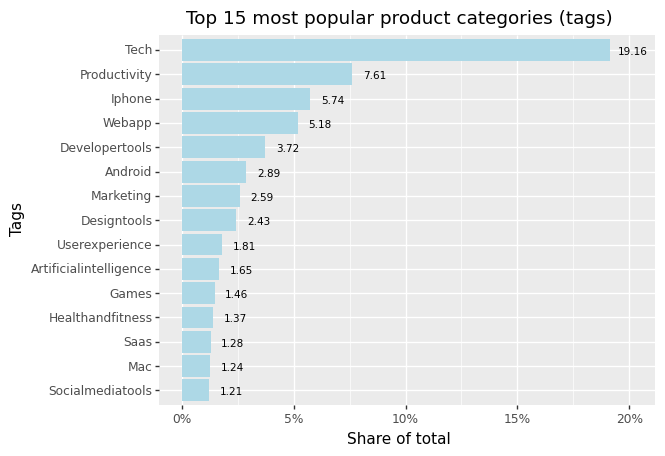

<ggplot: (94177172)>

In [133]:
#Unnest tags
unnested_tags = df_cleaning.assign(single_tags = _.category_tags.str.split(',')) >> unnest('single_tags')
#Remove special characters and capitalize
unnested_tags.single_tags = unnested_tags.single_tags.str.replace("\W", "", regex=True).str.capitalize()

#Find top 15 tags as percent of total unnested tags
top_15 = pd.DataFrame(unnested_tags.single_tags.value_counts()) \
    .assign(count_tags = lambda x: np.sum(x['single_tags'])) \
    .assign(percent = lambda x: x['single_tags']/x['count_tags']) \
    .nlargest(15, columns = 'percent').reset_index(names='tags') \
    .sort_values('percent', ascending=False)
    
#Plot top 15 tags
(
    top_15 >> ggplot(aes(x = 'reorder(tags, percent)', y = 'percent')) +
    geom_col(fill = 'lightblue') +
    geom_text(aes(label='percent*100'),
                size = 7.5, 
                va = 'center_baseline',
                nudge_y = 0.01,
                format_string='{:.2f}') +  
    coord_flip() +
    scale_y_continuous(labels = percent_format()) +
    labs(x = "Tags", 
            y = "Share of total",
            title = "Top 15 most popular product categories (tags)")
)

TECH category takes 20% of total products. The difference between first and second place is extraordinary. We are going to look into it by looking into popularity of these tags over time.

First let's define new variables:
- n_month - how many records of unnested categories are present in consecutive month
- n_month_category - how many records are in a given category (in particular month)
- percentage of above: cat_per_month = n_month_category / n_month

In [134]:
#Group records by month and summarize
by_month = df_cleaning.groupby(pd.Grouper(key="release_date", axis = 0, freq="M"), as_index=False).size().rename(columns = {'size': 'n_month'})

#Group by month_+single_tags then summarize
#Rename the aggregation to "n_month_category" number of products in a given category per month
by_month_category = \
    unnested_tags.groupby([pd.Grouper(key='release_date', axis=0, freq='M'), "single_tags"]).size() \
    .reset_index().rename(columns = {0: "n_month_category"}) \
    .sort_values(by = ['single_tags'], ascending=False)

#Merge with by_month which show how many products total are in particular month
#Create 'cat_per_month' - percentage of category in particular month
by_month_category = by_month_category \
    .merge(by_month, how='left') \
    .assign(cat_per_month = lambda x: x['n_month_category'] / x['n_month']) \
    .sort_values(by = "cat_per_month", ascending=False)
by_month_category.head(3)

,release_date,single_tags,n_month_category,n_month,cat_per_month
2136,2014-07-31,Tech,779,780,0.998718
2172,2014-05-31,Tech,439,440,0.997727
2215,2014-12-31,Tech,820,822,0.997567


#### Slope calculation
To visualize which categories are trending over time, we normalize percentage of each category within given month in <0,1> range. This way we can view categories in terms of their popularity change by fitting linear regression and comparing slope values between them.

In [135]:
#Grouped by single_tags to normalize percentage scores cat_per_month within tag categories 
#Rename normalized cat_per_month to 'Y'
by_month_category = by_month_category \
    .merge(by_month_category.groupby('single_tags', as_index=False).cat_per_month.transform(lambda x: (x-x.min()) / (x.max() - x.min())).rename(columns = {'cat_per_month': 'Y'}),
         left_index=True,
         right_index=True,) \
    .sort_values(by = "release_date") 
by_month_category.head(3)

,release_date,single_tags,n_month_category,n_month,cat_per_month,Y
11081,2014-01-31,Ecommerce,1,347,0.002882,0.037441
8627,2014-01-31,Hiringandrecruiting,1,347,0.002882,0.048034
2677,2014-01-31,Spreadsheets,1,347,0.002882,0.239442


In [136]:
#pivot wider single_tag to column (currently datetime ordering which is not supported by linregress function)
#create new sequence column 'seq' for enumerating grouped single_tags
#pivot longer (melt) - into previous long form with new 'seq' column
#replace all NaN's with 0
#groupby 'single_tags', for calculating slope and applying linear regression
from scipy.stats import linregress
slope_calc = by_month_category \
    .pivot(index="release_date", columns="single_tags", values="Y") \
    .assign(seq = lambda x: range(0, x.shape[0])) \
    .melt(id_vars=['seq'], value_name='Y') \
    .replace(np.nan, 0) \
    .groupby('single_tags', as_index=False) \
    .apply(lambda x: linregress(x.seq, x.Y).slope) \
    .rename(columns = {None: 'slope'})
slope_calc.head()

,single_tags,slope
0,,-0.000774
1,2,0.000000
2,3dprinting,-0.000012
3,3ds,-0.000583
4,Abtesting,0.000861


Slope values for each category are calculated, so it's possible to find TOP- and DOWN-trending categories during Product Hunt existence.

In [137]:
#Merge by_month_category with newly calculated slope; concatenate name of category with its slope value.
by_month_category = by_month_category.merge(slope_calc, how = 'left').assign(single_tags = lambda x: x.single_tags.astype(str) + " - slope = " + x['slope'].round(4).astype(str))

#TOP 9
top_9 = slope_calc.nlargest(9, columns = 'slope').assign(single_tags = lambda x: x.single_tags.astype(str) + " - slope = " + x['slope'].round(4).astype(str))
#BOTTOM 9
bottom_9 = slope_calc.nsmallest(9, columns = 'slope').assign(single_tags = lambda x: x.single_tags.astype(str) + " - slope = " + x['slope'].round(4).astype(str))
print(f"TOP 9: {list(top_9.values[:,0])}\n\nBOTTOM 9: {list(bottom_9.values[:,0])}")

#New DF containing only top and bottom categories
by_month_category_top_9 = by_month_category[by_month_category.isin(top_9.values[:,0]).any(axis='columns')].astype({'single_tags': 'category'})
by_month_category_bottom_9 = by_month_category[by_month_category.isin(bottom_9.values[:,0]).any(axis='columns')].astype({'single_tags': 'category'})

TOP 9: ['Productivity - slope = 0.0118', 'Marketing - slope = 0.0106', 'Userexperience - slope = 0.0099', 'Artificialintelligence - slope = 0.0096', 'Developertools - slope = 0.0096', 'Saas - slope = 0.0089', 'Apple - slope = 0.0085', 'Designtools - slope = 0.0083', 'Socialmediatools - slope = 0.0083']

BOTTOM 9: ['Tech - slope = -0.012', 'Windows - slope = -0.0031', 'Ipad - slope = -0.0025', 'Linux - slope = -0.0024', 'Uber - slope = -0.0024', 'Books - slope = -0.0023', 'Standingdesks - slope = -0.0022', 'Appletv - slope = -0.002', 'Ps4 - slope = -0.002']


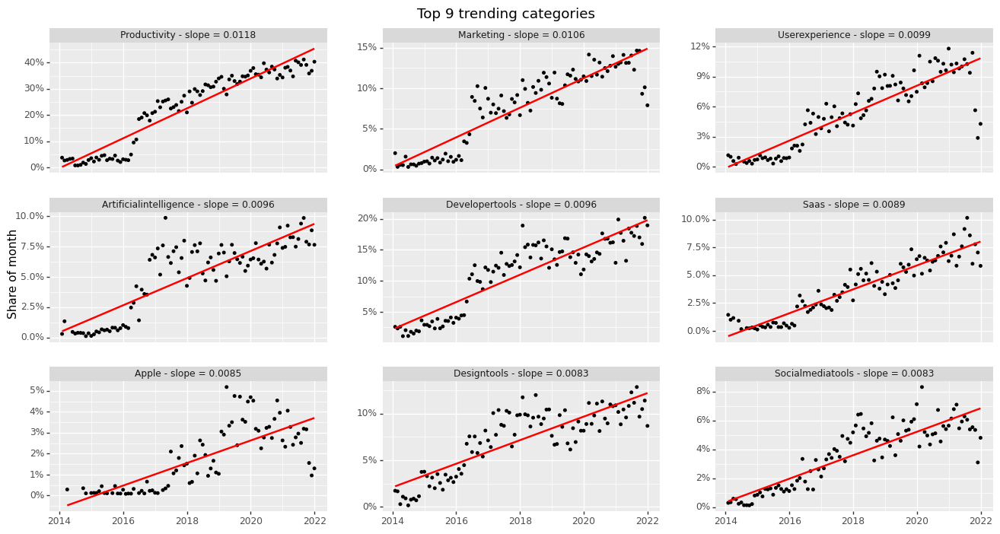

<ggplot: (142729189)>

In [138]:
#Plot top 9 categories
by_month_category_top_9.single_tags = by_month_category_top_9.single_tags.cat.reorder_categories(list(top_9.values[:,0]))
(
    by_month_category_top_9 >> 
    ggplot(aes(x = 'release_date', y = 'cat_per_month')) +
    geom_point(size=1) +
    geom_smooth(method='lm', se = False, color='red') +
    facet_wrap('single_tags', scales = 'free_y') +
    scale_y_continuous(labels = percent_format()) +
    scale_x_datetime(breaks=date_breaks('2 year'), labels=date_format('%Y')) +
    labs(y = "Share of month", 
         title = "Top 9 trending categories",
         x = "") +
    theme(subplots_adjust={'wspace': 0.2, 'hspace': 0.3},
          figure_size=(16, 8))
)

No 'Tech' tag despite holding the first place in overall tags ranking before. From 260 categories available, Productivity, Developertools and Marketing reach in the end of 2021 around 70% share altogether. AI-tagged solutions also ramped up significantly since 2016.

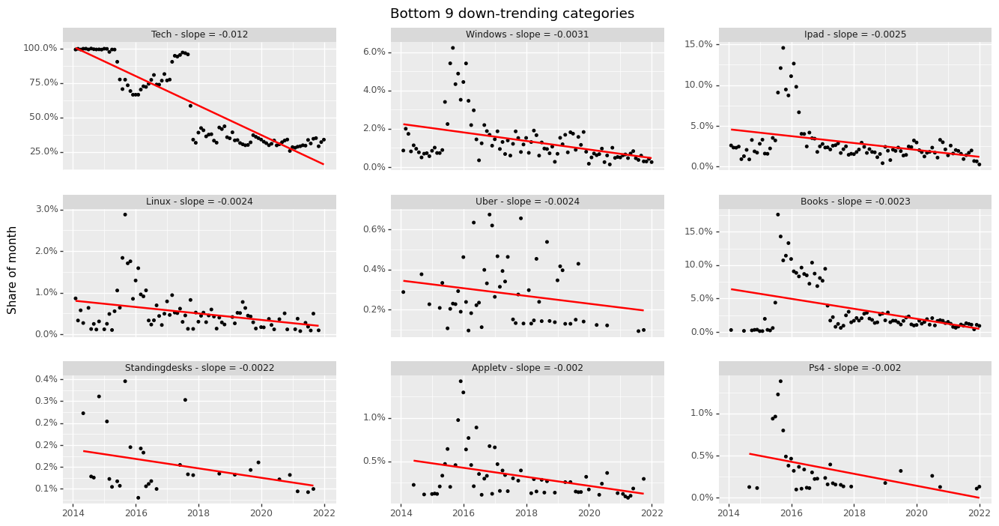

<ggplot: (142544933)>

In [139]:
#Plot bottom 9 categories
by_month_category_bottom_9.single_tags = by_month_category_bottom_9.single_tags.cat.reorder_categories(list(bottom_9.values[:,0]))
(
    by_month_category_bottom_9.assign(cat_per_month = lambda x: x.cat_per_month*100) >> 
    ggplot(aes(x = 'release_date', y = 'cat_per_month')) +
    geom_point(size=1) +
    geom_smooth(method='lm', se = False, color='red') +
    facet_wrap('single_tags', scales = 'free_y') +
    scale_y_continuous(labels = custom_format('{:.1f}%')) +
    scale_x_datetime(breaks=date_breaks('2 year'), labels=date_format('%Y')) +
    labs(y = "Share of month", 
         title = "Bottom 9 down-trending categories",
         x = "") +
    theme(subplots_adjust={'wspace': 0.2, 'hspace': 0.3},
          figure_size=(16, 8))
)

Now it's clearly seen what happened to TECH tags. It was the omnipresent category in the beginning of Product Hunt, and even today people tag their product with it, altough it doesn't introduce any meaningful information about the product itself. The second bottom-place holds Windows which is not surprising as PC era has ended. Altough platforms like Windows/Linux have blended into offices for good, developers know that there is a much higher chance of successful startup if they invest their time in one of the modern IT topics.

There are also peaks between 2015-2016 on multiple graphs, as this is the year where Product Hunt peaked in its popularity, as seen on previous graph.

### Most common tags occuring together
Because we saw on previous chart that <b>Tech</b> category was in different stages of Product Hunter life 'popular' or not, we exclude it as basically all of the platform is only about <b>Tech</b> products.

In [140]:
cat = unnested_tags \
    .query("single_tags != 'Tech'").groupby('_id')['single_tags'] \
    .agg(list) \
    .apply(lambda x: list(combinations(set(x),2))) \
    .explode()

cat = cat.value_counts().nlargest(15).reset_index(name="n").rename(columns={'index': 'c'}).astype({'c': 'str'})
# Bar plot 
fig = px.bar(cat, x='n', y='c', title = "Top 15 pairs of tags occuring together")
fig.update_layout(xaxis_title='Number of pairs', yaxis_title='', bargap=0.1)
fig.show()

The most popular choice is creating a mobile app for two popular platforms at once - Android and Iphone. In top 15 we also have majority of trending tags seen ealier, or sometimes even both of them as "SAAS, Productivity" or "Productivity, Marketing".

### TOP Hunters
We know that one of the hunter: 'chrismessina', is particularly active on the portal. Does this activity influence succesfullness of launching campaign?

In [141]:
# TOP 10 most active hunters
print(df_cleaning.hunter.value_counts().nlargest(10))

chrismessina       2582
kevin              2370
_jacksmith         1161
erictwillis        1041
kristofertm         826
deleted-72708       808
rrhoover            692
bramk               555
aaronoleary         458
nikkielizdemere     453
Name: hunter, dtype: int64


In [142]:
# Obtain top 10 hunters as a list
top_10_hunters = list(df_cleaning.hunter.value_counts().nlargest(10).index)
# Filter out only top 10 hunters from main DF and obtain their product_ranking sizes
hunter_size = df_cleaning[df_cleaning.hunter.isin(top_10_hunters)].groupby(by=['product_ranking', 'hunter'], as_index=False, dropna=False).size().sort_values('size', ascending=False)

# Gather in one DF also sum of products per hunter
hunter_size = hunter_size \
    .merge(
        hunter_size.groupby('hunter', as_index=False, dropna=False).sum().rename(columns = {'size': 'hunter_total'}).drop(columns = 'product_ranking'),
        how='left') \
    .assign(percent_hunter = lambda x: x['size'] * 100 / x['hunter_total']) \
    .astype({'product_ranking': 'category', 'hunter': 'category'}) \
    .sort_values(by="product_ranking")

#Order of hunters by winning product_ranking AND excluding NaN (that is products which did not won an award at all)
order_hunters = list(hunter_size.query('product_ranking.notna()', engine='python').groupby('hunter').sum(numeric_only=True).sort_values(by="percent_hunter", ascending=False).index)

#Bar plot 
fig = px.bar(hunter_size, x='hunter', y='percent_hunter', color='product_ranking', title = "Performance of hunters in terms of winning PRODUCT RANKING awards<br><sup>Only successful products shown")
fig.update_layout(xaxis_title='Hunter', yaxis_title='Share of total [%]', bargap=0.1)
fig.update_xaxes(categoryorder='array', categoryarray = order_hunters)
fig.show()

The best hunter got 39% of his products awarded, and 1 in 10 of his products even got the 1st price!
If some of these hunters are so successful there could be two explanations:
- their marketing techniques are extremely good
- they have knowledge about ProductHunter community and they only pick/post products when they suspect it's going to be received well by the community.

The first statement is more plausible in my opinion, however one thing is known for certain - if you want to have a successful launching campaign, you better contact one of TOP 10 hunters.

### Android / Apple platform battle
Now looking solely at 'website' variable we attempt to show the ever-lasting battle between iPhone and Android. Although the 'category_tags" were already examined, the author is able to place there multiple categories at the same time. However placing the actual product on the Google/Apple store itself store may be a more accurate indicator if the application has already been launched and working.

In [143]:
print(f'Android applications: {df_cleaning[df_cleaning.websites.str.contains("play.google.com") == True].shape[0] } \
    Apple aaplications: {df_cleaning[df_cleaning.websites.str.contains("itunes.apple.com|apps.apple.com") == True].shape[0]}')

Android applications: 6863     Apple aaplications: 14873


In [144]:
platform = df_cleaning \
    .assign(android = lambda x: x.websites.str.contains("play.google.com")) \
    .assign(iphone = lambda x: x.websites.str.contains("itunes.apple.com|apps.apple.com"))

conditions = [
    ((platform.android == True) & (platform.iphone == True)),
    ((platform.android == False) & (platform.iphone == False)),
    (platform.android == True),
    (platform.iphone == True),
    ]
values = ['Both', 'Other', 'Android', 'iPhone']
platform['and_vs_iph'] = np.select(conditions, values)

In [145]:
#Group by quarter
by_quarter = df_cleaning.groupby(pd.Grouper(key="release_date", axis = 0, freq="Q"), as_index=False).size().rename(columns = {'size': 'n_quarter'})

#Group by quarter and platform
by_quarter_platform = \
    platform.groupby([pd.Grouper(key='release_date', axis=0, freq='Q'), "and_vs_iph"]).size() \
    .reset_index().rename(columns = {0: "n_quarter_category"}) \
    .sort_values(by = ['and_vs_iph'], ascending=False)

by_quarter_platform = by_quarter_platform \
    .merge(by_quarter, how='left') \
    .assign(cat_per_quarter = lambda x: x['n_quarter_category']*100/x['n_quarter']) \
    .sort_values(by="release_date")
by_quarter_platform

#Plot line trends for platforms
fig = px.line(by_quarter_platform.query('and_vs_iph != "Other"'),
                 x='release_date', y='cat_per_quarter', color='and_vs_iph',
                 title="Android vs. Iphone - grouped quaterly",
                 labels = {'release_date': 'Release Date', 'cat_per_quarter': 'Share of total products [%]', 'and_vs_iph': 'Platform'},
                 width=1200,)
fig.update_layout(legend=dict(
yanchor="auto",
y=.97,
xanchor="right",
x=.99
))
fig.show()

iPhone was more popular from the very beginning and altough its lead diminishes - it still holds the 1st place in the end of 2021 - 7.7% share vs 2.8% for Android. Nevertheless developers try to build their apps for both platforms to reach to more people and this gap is getting smaller as we see looking at 'Both' trend and 'Top 15 pairs of tags occuring together' chart.

### Summary
This dataset is very valuable as Product Hunt being one of the places startups choose to promote themselves allows us to monitor trending technologies. We could also identify hunters who are extremely successful in promoting or finding products, and check current situation regarding Android/iPhone popularity. It's worth noting that we didn't touch <i>product_description</i> and <i>comments</i> which would allow to draw interesting information with NLP about promoting the product and winning by them awards